In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 15.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 63.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 34.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 27.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 87.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from pathlib import Path
import time
import json
from google.colab.patches import cv2_imshow # Import cv2_imshow
import cv2
import numpy as np
import matplotlib.pyplot as plt
#import pytesseract
from PIL import Image
plt.style.use('dark_background')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [93]:
def show_img(title, img, cmap='gray'):
    plt.figure(figsize=(6, 4))
    plt.imshow(img, cmap=cmap)
    plt.title(title)
    plt.axis('off')
    plt.show()

def show(title, img, cmap='gray', size=(6, 4)):
    plt.figure(figsize=size)
    plt.title(title)
    plt.imshow(img, cmap=cmap)
    plt.axis('off')
    plt.show()

def detect_license_plates(image):
    """
    Detect license plates in an image using YOLO

    Args:
        image: Input image (numpy array or path)

    Returns:
        List of detected plate regions with coordinates
    """
    # Run YOLO inference
    results = yolo_model(image, conf=confidence_threshold)

    detected_plates = []

    for r in results:
        boxes = r.boxes
        if boxes is not None:
            for box in boxes:
                # Get coordinates
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                confidence = box.conf[0].cpu().numpy()

                detected_plates.append({
                    'bbox': [int(x1), int(y1), int(x2), int(y2)],
                    'confidence': float(confidence)
                })

    return detected_plates

def crop_license_plate(image, bbox, padding=10):
    """
    Crop license plate region from image with padding

    Args:
        image: Original image
        bbox: Bounding box [x1, y1, x2, y2]
        padding: Padding around the plate
    """
    x1, y1, x2, y2 = bbox
    h, w = image.shape[:2]

    # # Add padding
    # x1 = max(0, x1 - padding)
    # y1 = max(0, y1 - padding)
    # x2 = min(w, x2 + padding)
    # y2 = min(h, y2 + padding)

    # Without padding
    x1 = max(0, x1)
    y1 = max(0, y1)
    x2 = min(w, x2)
    y2 = min(h, y2)

    return image[y1:y2, x1:x2]
    # return image

def visualize_results_and_return_best_bbox(image, results):
    """
    Visualize detection and recognition results

    This returns x1 y1 x2 y2 of the best bbox
    """
    # Create a copy for visualization
    vis_image = image.copy()

    # Draw bounding boxes and text
    best_box = None
    best_det_conf = None

    for result in results:
        bbox = result['bbox']
        det_conf = result['confidence']

        if best_box is None or det_conf > best_det_conf:
            best_box = bbox
            best_det_conf = det_conf

    x1, y1, x2, y2 = best_box

    # Draw bounding box of the best
    cv2.rectangle(vis_image, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # Draw labels if it exists.
    # cv2.putText(vis_image, "", (x1, y1-10),
    #             cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
    cv2.putText(vis_image, str(best_det_conf), (x1, y2+20),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

    cv2_imshow(vis_image)
    return best_box

Steps:
1. detect plate and return all the boxes,
2. visualize the best box and return the bbox of that image
3. crop and return the cropped image

In [321]:
yolo_model = YOLO("/content/drive/MyDrive/datasets/test-yolo-2-4-annotations/bd_license_plate_detector.pt")
confidence_threshold = 0.25

In [271]:
def unsharp_mask(image, blur_ksize=(5, 5), alpha=1.5, beta=-0.5, gamma=0):
    # Blur the image
    blurred = cv2.GaussianBlur(image, blur_ksize, 0)

    # Weighted sum: result = alpha*image + beta*blurred + gamma
    sharpened = cv2.addWeighted(image, alpha, blurred, beta, gamma)

    return sharpened

def denoise_bilateral(image):
    return cv2.bilateralFilter(image, d=9, sigmaColor=75, sigmaSpace=75)

def morphological_closing(binary_img):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
    closed = cv2.morphologyEx(binary_img, cv2.MORPH_CLOSE, kernel, iterations=1)
    return closed

In [372]:
def preprocess_image(img):
    # Step 1: Grayscale

    enhanced = unsharp_mask(img)
    denoised = denoise_bilateral(enhanced)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # show("Grayscale", gray)

    # Step 2: Contrast enhancement using morphological filters
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    top_hat = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, kernel)
    black_hat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, kernel)
    enhanced = cv2.add(gray, top_hat)
    enhanced = cv2.subtract(enhanced, black_hat)
    # show("Contrast Enhanced", enhanced)

    # Step 3: Thresholding
    # binary = cv2.adaptiveThreshold(
    #   gray,
    #   255,
    #   cv2.ADAPTIVE_THRESH_MEAN_C,  # or MEAN_C
    #   cv2.THRESH_BINARY_INV,
    #   blockSize=15,  # or 11, 21 (odd numbers only)
    #   C=5        # tweak this: + makes lighter, - makes darker
    # )

    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # show("Otsu Binary Threshold", binary)

    # Step 4: Erosion + Dilation (noise cleanup)
    binary = cv2.erode(binary, np.ones((2,2), np.uint8), iterations=1)
    binary = cv2.dilate(binary, np.ones((2,2), np.uint8), iterations=1)
    # show("After Erosion + Dilation", binary)

    return binary

In [370]:
def find_contours(dimensions, img, original_for_draw=None):
    # Get contours
    cntrs, _ = cv2.findContours(img.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    lower_width, upper_width, lower_height, upper_height = dimensions

    # Sort by area, keep top 15 (as you did)
    cntrs = sorted(cntrs, key=cv2.contourArea, reverse=True)[:18]

    x_cntr_list = []
    target_contours = []
    img_res = []

    # Prepare image to draw bounding boxes on
    draw_img = original_for_draw.copy() if original_for_draw is not None else np.dstack([img]*3)

    for i, cntr in enumerate(cntrs):
        x, y, w, h = cv2.boundingRect(cntr)
        if cv2.contourArea(cntr) > 50:
          # Optionally filter by size, or use all
          if True:
              x_cntr_list.append(x)

              char_copy = np.ones((44, 24), dtype=np.uint8) * 255
              char = img[y:y+h, x:x+w]
              char = cv2.resize(char, (20, 40))
              char_copy[2:42, 2:22] = char

              img_res.append(char_copy)

              # Draw box on the visualization image
              cv2.rectangle(draw_img, (x, y), (x+w, y+h), (124,252,0), 2)
              cv2.putText(draw_img, str(i+1), (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (124,252,0), 1)

    # Sort by x-coord (left to right)
    indices = sorted(range(len(x_cntr_list)), key=lambda k: x_cntr_list[k])
    img_res = [img_res[idx] for idx in indices]

    # Show image with boxes once
    plt.figure(figsize=(8, 6))
    plt.imshow(draw_img)
    plt.title("All Detected Contours on Plate")
    plt.axis('off')
    plt.show()

    return img_res

def segment_characters(image):
    # Resize plate and threshold
    img_lp = cv2.resize(image, (333, 335))

    # binary = cv2.adaptiveThreshold(
    #   img_lp,
    #   255,
    #   cv2.ADAPTIVE_THRESH_GAUSSIAN_C,  # or MEAN_C
    #   cv2.THRESH_BINARY_INV,
    #   blockSize=15,  # or 11, 21 (odd numbers only)
    #   C=5           # tweak this: + makes lighter, - makes darker
    # )

    _, binary = cv2.threshold(img_lp, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    binary = cv2.erode(binary, (3,3))
    binary = cv2.dilate(binary, (3,3))

    # Add white border
    # binary[0:3,:] = 255
    # binary[:,0:3] = 255
    # binary[332:,:] = 255
    # binary[:,330:] = 255

    dimensions = [binary.shape[0]/6, binary.shape[0]/2, binary.shape[1]/8, 2*binary.shape[1]/3]

    # Show binary image
    plt.imshow(binary, cmap='gray')
    plt.title("Binary Image Before Contours")
    plt.axis('off')
    plt.show()

    # Pass original image for drawing boxes
    return find_contours(dimensions, binary, original_for_draw=img_lp)

In [234]:
def crop_borders(image, top_pct=0.05, side_pct=0.0125, bottom_pct=0.0125):
    h, w = image.shape[:2]
    top = int(h * top_pct)
    bottom = int(h * (1 - bottom_pct))
    left = int(w * side_pct)
    right = int(w * (1 - side_pct))
    return image[top:bottom, left:right]


0: 480x640 1 license_plate, 559.7ms
Speed: 5.7ms preprocess, 559.7ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


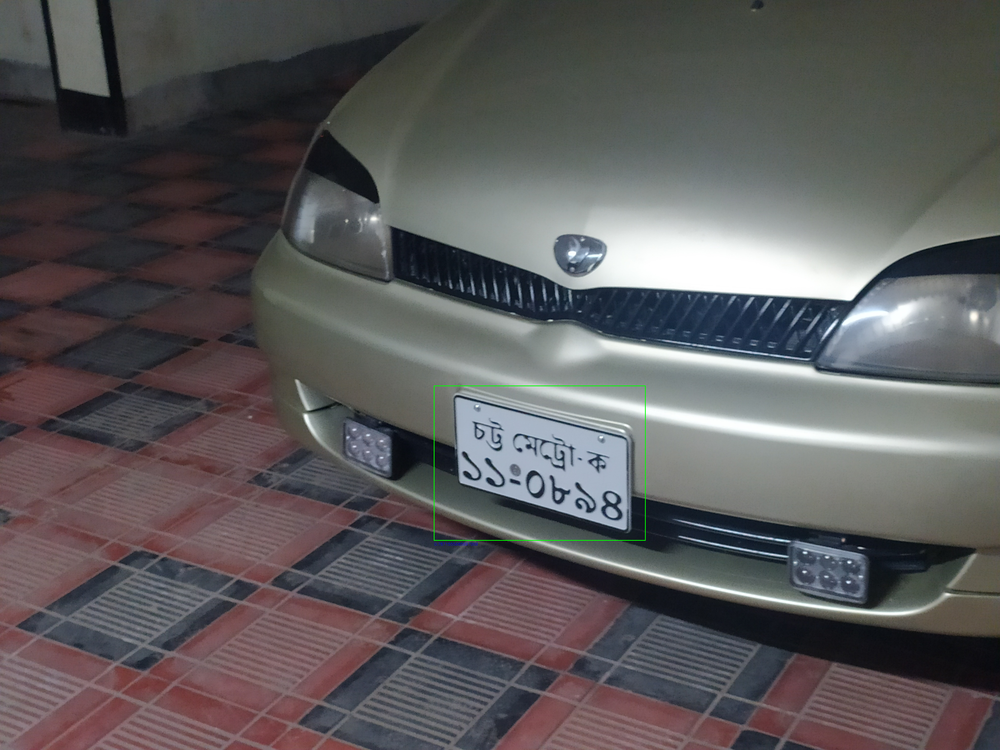

In [373]:
image_path = "/content/drive/MyDrive/datasets/test-yolo-2-4-annotations/images/Vehicle1688.jpg"
image = cv2.imread(str(image_path))

results = detect_license_plates(image)

bbox = visualize_results_and_return_best_bbox(image, results)

cropped_image = crop_license_plate(image, bbox)

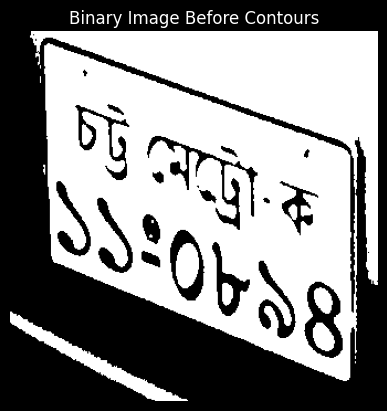

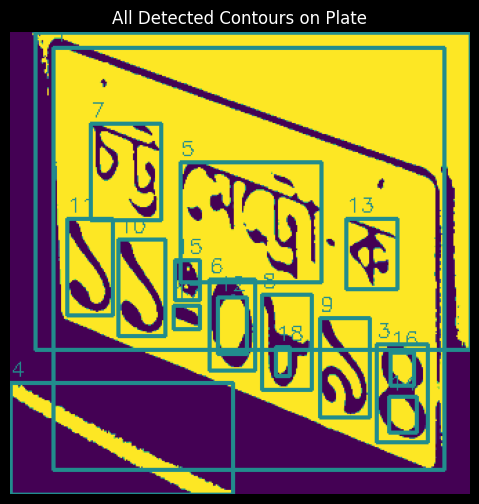

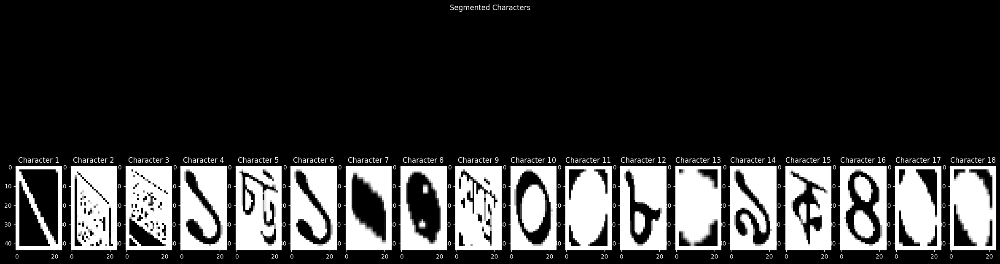

In [374]:
binary_plate = preprocess_image(cropped_image)
binary_plate = crop_borders(binary_plate)
#closed_img = morphological_closing(binary_plate)
characters = segment_characters(binary_plate)

# --- Show segmented characters ---
plt.figure(figsize=(30, 10))
for i, char in enumerate(characters):
    plt.subplot(1, len(characters), i + 1)
    plt.imshow(char, cmap='gray')
    plt.axis("on")
    plt.title(f"Character {i+1}")
plt.suptitle("Segmented Characters")
plt.show()
